### HELLO! This is a simple tool I have created to query optical photometry for nearby galaxies at a location of you choosing from SDSS DR12 in Vizier. Hope you find it useful! --Vic 07/31/2020

#### Note from CDK - this is a python 3 notebook.  If you receive an error on the "import util" step, make sure you are running this notebook in a python 3 environment

### Modified by JCR for future GRB use 12/12/2022

In [1]:
import warnings
warnings.filterwarnings('ignore')
from IPython.core.display import display, HTML
display(HTML("<style>.container { width:100% !important; }</style>"))

In [3]:
# Import necessary libraries
import warnings
import numpy as np
import os
from datetime import datetime
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
import matplotlib.patches as patches
import matplotlib.font_manager as font_manager
from matplotlib import colors
from matplotlib.ticker import PercentFormatter
import IPython.display
from IPython.core.display import display, HTML
import ipywidgets as widgets
import pickle
from astropy.io import fits, ascii
from astropy.table import Table, Column
from astropy import units as u
import astropy.wcs as wcs
from astropy.visualization import simple_norm, ImageNormalize, ZScaleInterval
from astropy.coordinates import SkyCoord, EarthLocation, AltAz, Angle
from astropy.nddata import Cutout2D
from astropy.time import Time, TimeDelta
from astroplan.plots import plot_airmass, dark_style_sheet, plot_finder_image
from astroplan import Observer, FixedTarget
from pytz import timezone
import pytz
import platform
from astroplan import Observer

# Set up Matplotlib for high-resolution display
%config InlineBackend.figure_format = 'retina'

# Print Python version
print(platform.python_version())

# Fetch dust map
from dustmaps.sfd import fetch, SFDQuery
fetch()
sfd = SFDQuery()

# Import utility functions from external file
from utilities import util

3.10.12
Checking existing file to see if MD5 sum matches ...
File exists. Not overwriting.
Checking existing file to see if MD5 sum matches ...
File exists. Not overwriting.


# Name of GRB, metadata, coordinates, extinction, PS1 image

Successfully downloaded Swift GRB data...
Got GRB metadata
Time: 11:41:34
Trigger Number: 973628
BAT T90: 0.62
XRT RA: 00:22:43.68
XRT Dec: -00:16:59.4
Milky Way Av=0.0846 mag
We need to download 2 PS1 images.
https://mast.stsci.edu/api/v0/download/file?uri=mast:PS1/product/rings.v3.skycell.1233.090.stk.g.unconv.fits
1/5 filters complete
We need to download 2 PS1 images.
https://mast.stsci.edu/api/v0/download/file?uri=mast:PS1/product/rings.v3.skycell.1233.090.stk.r.unconv.fits
2/5 filters complete
We need to download 2 PS1 images.
https://mast.stsci.edu/api/v0/download/file?uri=mast:PS1/product/rings.v3.skycell.1233.090.stk.i.unconv.fits
3/5 filters complete
We need to download 2 PS1 images.
https://mast.stsci.edu/api/v0/download/file?uri=mast:PS1/product/rings.v3.skycell.1233.090.stk.z.unconv.fits
4/5 filters complete
We need to download 2 PS1 images.
https://mast.stsci.edu/api/v0/download/file?uri=mast:PS1/product/rings.v3.skycell.1233.090.stk.y.unconv.fits
5/5 filters complete


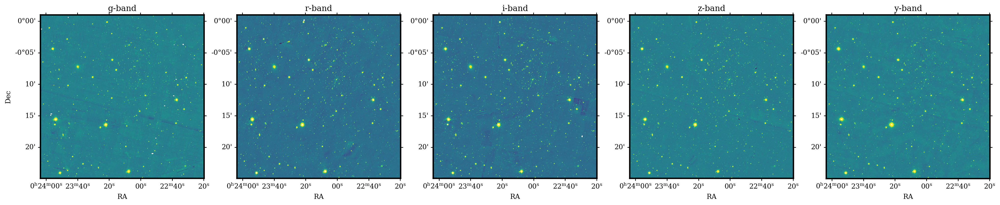

In [5]:
#######################################################
############### FILL IN FOR NEW GRB ###################
#######################################################
object_name = 'GRB200522A'#'GRB211211A'#'GRB970228' # Add the name of your GRB
data_path = '/results/' # Change for yourself
ra  = '00:22:40.3'#'05:01:46.7'#'14:09:10.08'#'05:01:46.7' # RA in J2000
dec = '-00:15:49.9'#'+11:46:53.0'#'+27:53:18.8'#'+11:46:53.0' # Dec in J2000
uncertainty = 1.9 # in arcseconds
#######################################################
#######################################################

get_ps1_img = True

# Parse coord
coord = util.parse_coord(ra, dec)

# Get Swift data
swift_data = util.get_grb_data(object_name)

# Get MW Av
av = sfd(coord) * 3.1
print('Milky Way Av={0} mag'.format(('%7.4f'%av).strip()))

# Get PS1 images if it exists - adjust filters if desired
filters = ['g', 'r', 'i', 'z', 'y']

plt.figure(figsize=(5*len(filters),6))
plt.rcParams['font.family'] = 'serif'
plt.rcParams['axes.linewidth'] = 2

if get_ps1_img:
    for i,filt in enumerate(filters):
        img = util.downloadPS1(coord, filt, outdir=data_path)
        v = i+1
        if img and os.path.exists(img):
            # open the image contents, create wcs coordinate projections and a subplot axis
            hdu = fits.open(img)
            wcs_proj = wcs.WCS(hdu[1].header)
            ax1 = plt.subplot(1,len(filters),v,projection=wcs_proj)

            # get image data from the hdu
            data = hdu[1].data           

            # build the subplot using image data and wcs coordinates
            norm = simple_norm(data, 'linear', percent=99.)
            ax1.imshow(data, norm=norm, origin='lower', cmap='viridis')
            ax1.set_title(filt+'-band')
            
            # if every filter's plot is labelled with 'Dec', 
            # part of the image is covered up by the label,
            # hence the if statement below
            if(i == 0):
                ax1.set_ylabel('Dec')
            else:
                ax1.set_ylabel(' ')
            ax1.set_xlabel('RA')

            # get the XRT position in this and zoom in on the image (30arcsec by 30arcsec)

            # progress report for images after each image completed
            print(str(i+1) + '/' + str(len(filters)) + ' filters complete')
            
plt.show()

# Catalog search
Will grab metadata for sources around input coord. 
Edit the catalog keywords to grab the sources you are interested in - PS1 and SDSSDR12 are the best for SGRB redshifts.

In [43]:
# This method will search and crossmatch catalogs given an input list

# maximum number of arcsec away to search
MAX_RADIUS = 20.0;

allcatnames = ['ps1dr2','strm','sdssdr12','2mass','unwise','glade','des']
catnames = ['ps1dr2','glade','sdssdr12'] # abbreviated catalog list
search_radius = MAX_RADIUS*u.arcsec

# CHECK WHY PHOTO-Z ARE NEVER BEING PULLED

# search catalog for matching objects within 2 arcsec
catalog = util.search_catalogs(coord, allcatnames, search_radius=search_radius,
    match_radius=2.0*u.arcsec, outfile=os.path.join(data_path,object_name+'.cat'))

# Mask the catalog around input coord
mask_util_table = util.mask_catalog_around_coord(catalog, coord, radius=20.0*u.arcsec)

#def get_catalog_name(entry):
#    for catalog_name in allcatnames:
#        if not entry[catalog_name].mask.any():
#            return catalog_name
#    return 'Unknown Catalog'

# add a column to tell us which catalog each entry came from
#catalog_names = [get_catalog_name(entry) for entry in mask_util_table]
#catalog_column = Column(name='Catalog', data=catalog_names, dtype='str')
#mask_util_table.add_column(catalog_column, index=0)*/

new_column_data = [None] * len(mask_util_table)
new_column = Column(data=new_column_data, name='catalog_name')
mask_util_table.add_column(new_column, index=0)

# (if the output name from any of the catalogs changes this must change too)
# column ps1dr2_objName - must exist if the catalog is ps1dr2
allCatColCheck = ['strm_raMean', 'sdssdr12_RA_ICRS', '2mass_RAJ2000', 'unwise_RAJ2000', 'glade_RAJ2000', 'des_imag'];
for i in range(0, len(mask_util_table)):
    if mask_util_table[i]['ps1dr2_objName'] and mask_util_table[i]['ps1dr2_objName'][0]:
        mask_util_table[i][0] = 'ps1dr2';
    else:
        for j in range(0, len(allCatColCheck)):
            if mask_util_table[i][allCatColCheck[j]] and mask_util_table[i][allCatColCheck[j]] > -1:
                mask_util_table[i][0] = allCatColCheck[j].split('_')[0];


# there does not appear to be a z-phot value for ps1dr2 entries
for i, value in enumerate(mask_util_table[1]):
    if isinstance(value, (int, float)) and 0 < value < 1:
        print(f"Column {i}: {value}")
    elif isinstance(value, str) and value.isdigit() and 0 <= int(value) <= 1:
        print(f"Column {i}: {value}")
# QUESTION, WHAT IS THE Z-PHOT FOR PS1DR2 IF ANY? this is why sometimes no color in next plot

/resultstryagain/GRB200522A.cat exists.  Do you want to use this catalog?([y]/n):  y


Column 14: 0.983639466561041
Column 26: 0.3264699876308441
Column 27: 0.3264699876308441
Column 30: 0.9951026013592519
Column 31: 0.09873669806958418
Column 125: 0.004369166434279136


<TableColumns names=('catalog_name','ps1dr2_objName','ps1dr2_objAltName1','ps1dr2_objAltName2','ps1dr2_objAltName3','ps1dr2_objID','ps1dr2_uniquePspsOBid','ps1dr2_ippObjID','ps1dr2_surveyID','ps1dr2_htmID','ps1dr2_zoneID','ps1dr2_tessID','ps1dr2_projectionID','ps1dr2_skyCellID','ps1dr2_randomID','ps1dr2_batchID','ps1dr2_dvoRegionID','ps1dr2_processingVersion','ps1dr2_objInfoFlag','ps1dr2_qualityFlag','ps1dr2_raStack','ps1dr2_decStack','ps1dr2_raStackErr','ps1dr2_decStackErr','ps1dr2_raMean','ps1dr2_decMean','ps1dr2_raMeanErr','ps1dr2_decMeanErr','ps1dr2_epochMean','ps1dr2_posMeanChisq','ps1dr2_cx','ps1dr2_cy','ps1dr2_cz','ps1dr2_lambda','ps1dr2_beta','ps1dr2_l','ps1dr2_b','ps1dr2_nStackObjectRows','ps1dr2_nStackDetections','ps1dr2_nDetections','ps1dr2_ng','ps1dr2_nr','ps1dr2_ni','ps1dr2_nz','ps1dr2_ny','ps1dr2_gQfPerfect','ps1dr2_gMeanPSFMag','ps1dr2_gMeanPSFMagErr','ps1dr2_gMeanPSFMagStd','ps1dr2_gMeanPSFMagNpt','ps1dr2_gMeanPSFMagMin','ps1dr2_gMeanPSFMagMax','ps1dr2_gMeanKronMag','ps

Min. Pcc = 0.0126. XRT offset 4.20 arcsec from an r = 20.00 mag object with photo-z = -999.0000.


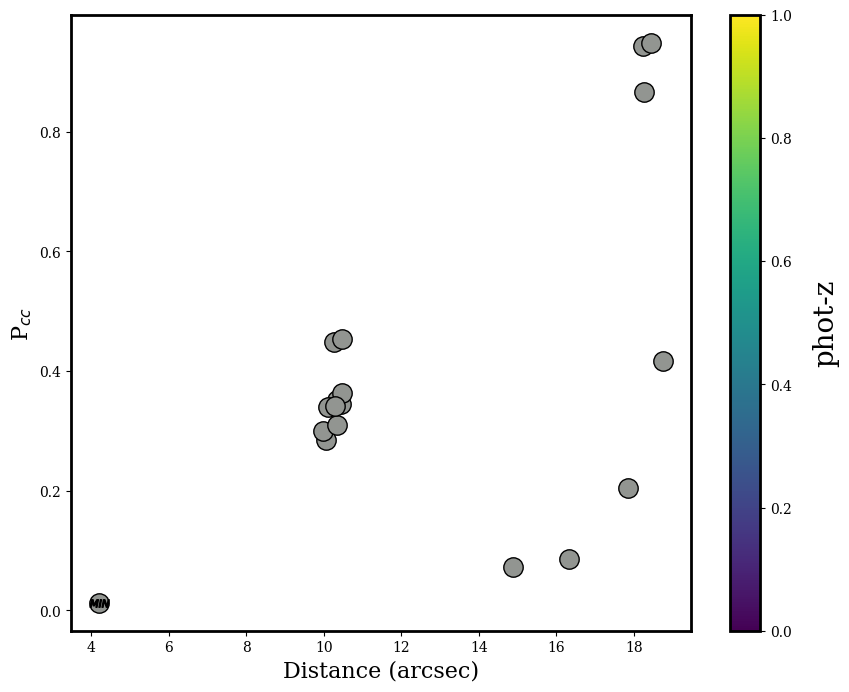

We need to download 2 PS1 images.
https://mast.stsci.edu/api/v0/download/file?uri=mast:PS1/product/rings.v3.skycell.1233.090.stk.g.unconv.fits
/resultstryagain/rings.v3.skycell.1233.090.stk.g.unconv.fits exists.  Continuing...
1/5 filters complete
We need to download 2 PS1 images.
https://mast.stsci.edu/api/v0/download/file?uri=mast:PS1/product/rings.v3.skycell.1233.090.stk.r.unconv.fits
/resultstryagain/rings.v3.skycell.1233.090.stk.r.unconv.fits exists.  Continuing...
2/5 filters complete
We need to download 2 PS1 images.
https://mast.stsci.edu/api/v0/download/file?uri=mast:PS1/product/rings.v3.skycell.1233.090.stk.i.unconv.fits
/resultstryagain/rings.v3.skycell.1233.090.stk.i.unconv.fits exists.  Continuing...
3/5 filters complete
We need to download 2 PS1 images.
https://mast.stsci.edu/api/v0/download/file?uri=mast:PS1/product/rings.v3.skycell.1233.090.stk.z.unconv.fits
/resultstryagain/rings.v3.skycell.1233.090.stk.z.unconv.fits exists.  Continuing...
4/5 filters complete
We need 

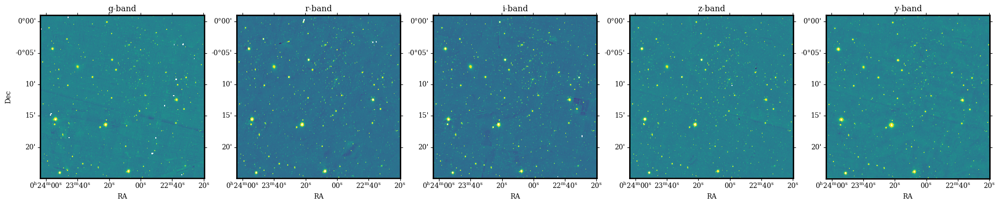

In [33]:
# The function you can use to calculate pcc is here:
def pcc(r,m): 
    sigma = (1/(0.33*np.log(10)))*10**(0.33*(m-24)-2.44) 
    prob = 1-np.exp(-(np.pi*(r**2)*sigma)) 
    return prob

# this function helps calculate the r_mag and no_r for the pcc_plot() function
def r_mag_helper(catalog, i, no_r):
    if catalog[i]['ps1dr2_rMeanKronMag']>0:
        r_mag = catalog[i]['ps1dr2_rMeanKronMag']           
    elif 'sdssdr12_rmag' in catalog.keys():
        if catalog[i]['sdssdr12_rmag']>0:
            r_mag = catalog[i]['sdssdr12_rmag']
        else:
            r_mag = -999.0
            no_r +=1
    elif 'des_rmag' in catalog.keys():
        if catalog[i]['des_rmag']>0:
            r_mag = catalog[i]['sdssdr12_rmag']
        else:
            r_mag = -999.0
            no_r +=1     
    else:
        r_mag = -999.0
        no_r +=1
    return r_mag, no_r

def pcc_plot(coord, catalog, object_name):
    
    # Distance is in arcsecond, not arcminute of the galaxy from the GRB
    coords = SkyCoord(catalog['ra'], catalog['dec'], unit='deg')
    distance = [c.separation(coord).arcsec for c in coords]
    
    zs=0
    plt.figure(figsize=(10,8))
    plt.rcParams['font.family'] = 'serif'
    plt.rcParams['axes.linewidth'] = 2
    
    z_gal,marks,dist,pccs,ra_pcc,dec_pcc,r,source = [],[],[],[],[],[],[],[]
    
    no_r=0
    for i in range(len(catalog)):
        # filter for a maximum distance here - currently 20 arcsec
        if(distance[i] > MAX_RADIUS):
            continue
            
        # get r-mag from PS1, SDSS or DES
        r_mag, no_r = r_mag_helper(catalog, i, no_r)
        
        # if the r_mag isn't n/a, find values for distance, source, pcc, et cetera        
        if r_mag!=-999.0:
            # Calculate Pcc
            pcc_val = pcc(distance[i], r_mag)
            zfound = 0

         #   print('hi')

            # Check for SDSS spec or phot z
            if 'sdssdr12_zsp' in catalog.keys() and catalog[i]['sdssdr12_zsp'] > 0:
                z_gal.append(catalog[i]['sdssdr12_zsp'])
                marks.append('s')
                srce = 'SDSS-spec'
                zfound = 1
                zs += 1
            elif 'sdssdr12_zph' in catalog.keys() and catalog[i]['sdssdr12_zph'] > 0:
                z_gal.append(catalog[i]['sdssdr12_zph'])
                marks.append('o')
                srce = 'SDSS-phot'
                zfound = 1
                zs += 1
            elif 'strm_z_phot' in catalog.keys() and catalog[i]['strm_z_phot'] > 0:
                z_gal.append(catalog[i]['strm_z_phot'])
                marks.append('o')
                srce = 'PS1-STRM'
                zfound = 1
                zs += 1
            elif 'glade_z' in catalog.keys() and catalog[i]['glade_z'] > 0:
                z_gal.append(catalog[i]['glade_z'])
                marks.append('o')
                srce = 'GLADE'
                zfound = 1
                zs += 1
            elif zfound == 0:
                z_gal.append(-999.0) # change for testing
                marks.append('o')
                srce = catalog[i][0];

        #    print(catalog[i])
        #    print(catalog.keys())
        #    print(catalog[i]['strm_z_phot'])
        #    print('hi2')
                
            dist.append(distance[i])
            pccs.append(pcc_val)
            r.append(r_mag)
            source.append(srce)
            ra_pcc.append(catalog['ra'][i])
            dec_pcc.append(catalog['dec'][i])

                
    dist = np.array(dist); pccs = np.array(pccs); marks = np.array(marks); z_gal = np.array(z_gal)
    ra_pcc = np.array(ra_pcc); dec_pcc = np.array(dec_pcc); rmag = np.array(r); source = np.array(source)
    
    # plot all of the points found above
    conditions = [(z_gal < 0), (z_gal > 0) & (marks == 'o'), (z_gal > 0) & (marks == 's')]
    markers = ['o', 'o', 's']
    colors = ['xkcd:gray', z_gal[conditions[1]], z_gal[conditions[2]]]
    zorders = [3, 10, 10]

    for cond, marker, color, zorder in zip(conditions, markers, colors, zorders):
        plt.scatter(dist[cond], pccs[cond], marker=marker, c=color, cmap='plasma_r', 
                    vmin=0.0, vmax=1.0, alpha=1, s=195, edgecolors='black', zorder=zorder)
    
    print('Min. Pcc = {0:.4f}. XRT offset {1:.2f} arcsec from an r = {2:.2f} mag object with photo-z = {3:.4f}.'.format(np.min(pccs),
                                                                                                                           dist[np.argmin(pccs)],
                                                                                                                           rmag[np.argmin(pccs)],
                                                                                                                           z_gal[np.argmin(pccs)]))

    # note: if you don't want the star to show just delete the next two lines of uncommented code
    color = 'xkcd:black'
    plt.scatter(dist[np.argmin(pccs)], np.min(pccs), marker = '$MIN$',c=color,
                    cmap='plasma_r',alpha = 1, vmin=0.0, vmax=1.0, s=195, edgecolors='black',zorder=10)
    
    # label plot axes and create a colorbar for phot-z values
    plt.ylabel('P$_{cc}$', fontsize = 16)
    plt.xlabel('Distance (arcsec)', fontsize = 16)
    clb = plt.colorbar()
    clb.solids.set_alpha(1)
    clb.set_label('phot-z', fontsize = 20, labelpad=15, rotation=90)
    plt.savefig(data_path+'_pcc.png', format = 'png', dpi=300, bbox_inches="tight")
    plt.show()

    # get a visaulization of the minimum pcc galaxy
    coord_min = util.parse_coord(ra_pcc[np.argmin(pccs)], dec_pcc[np.argmin(pccs)])
    # print(coord_min)
    # print(coord)
    # Get PS1 images if it exists - adjust filters if desired
    filters = ['g', 'r', 'i', 'z', 'y']

    plt.figure(figsize=(5*len(filters),6))
    plt.rcParams['font.family'] = 'serif'
    plt.rcParams['axes.linewidth'] = 2

    for i,filt in enumerate(filters):
        img = util.downloadPS1(coord_min, filt, outdir=data_path)
        v = i+1
        if img and os.path.exists(img):
            # open the image contents, create wcs coordinate projections and a subplot axis
            hdu = fits.open(img)
            wcs_proj = wcs.WCS(hdu[1].header)
            ax1 = plt.subplot(1,len(filters),v,projection=wcs_proj)

            # get image data from the hdu
            data = hdu[1].data           

            # build the subplot using image data and wcs coordinates
            norm = simple_norm(data, 'linear', percent=99.)
            ax1.imshow(data, norm=norm, origin='lower', cmap='viridis')
            ax1.set_title(filt+'-band')
            
            # if every filter's plot is labelled with 'Dec', 
            # part of the image is covered up by the label,
            # hence the if statement below
            if(i == 0):
                ax1.set_ylabel('Dec')
            else:
                ax1.set_ylabel(' ')
            ax1.set_xlabel('RA')

            # progress report for images after each image completed
            print(str(i+1) + '/' + str(len(filters)) + ' filters complete')  
    plt.show()
    
    return dist, pccs, z_gal, marks, ra_pcc, dec_pcc, rmag, source
                
dist, pccs, z_gal, marks, ra_pcc, dec_pcc, rmag, source = pcc_plot(coord, catalog, object_name)

# trim this plot to 20 arcsec on x-axis and get minimum only from that DONE, 
# visualize what the minimum galaxy is here DONE,
# make sure not duplicating multiple entries from different catalogs for same galaxy NOT SURE HOW TO DO CURRENTLY

In [34]:
# Here is an image of the cut out. I bet it looks super pretty!
# First tries SDSS, then PS1, then DES, then SkyMapper to get jpeg
# should have 100% sky coverage from those surveys

def make_legend(ax):
    
    colors = ['limegreen','r','xkcd:yellow orange', 'c', 'xkcd:shocking pink','xkcd:bright blue']
    labels = catnames
    handles = []
    
    for i in range(len(labels)):
        
        handle = patches.Patch(color=colors[i])
        handles.append(handle)
                     
    ax.legend(handles,labels,fontsize=12)
    

def best_pcc_img(coord,pccs,z_gal,marks,ra_pcc,dec_pcc,num=20,filters=['r'],boxsize=0.5,figsize=8,
                 colorcode_gal=True,use_cutout_img=False):
    
    # take only ten lowest pcc values
    args = np.argsort(pccs)
    
    # make pccs, z, marks, ra and dec into a table
    catalog_short = Table()
    catalog_short['ra'] = ra_pcc[args][:num]
    catalog_short['dec'] = dec_pcc[args][:num]
    catalog_short['pcc'] = pccs[args][:num]
    catalog_short['z'] = z_gal[args][:num]
    
    plot_all_filts(coord,object_name,catalog_short,filters,boxsize=boxsize,figsize=figsize,
                   use_cutout_img=use_cutout_img, best_pcc_img=True)#,colorcode_gal=colorcode_gal,best_pcc_img=True)
    
    return catalog_short

def plot_all_filts(coord, object_name, catalog, filters, boxsize=1.0, figsize=8,
                   colorcode_gal = True, best_pcc_img = False, use_cutout_img = False):

    #%matplotlib widget
    %matplotlib inline

    for i,filt in enumerate(filters):
        if use_cutout_img == False:
            img = util.downloadPS1(coord, filt, outdir=data_path)
            hdu = fits.open(img)
            data = hdu[1].data
            wcs_proj = wcs.WCS(hdu[1].header)
        else:
            img = data_path+use_cutout_img[i]
            hdu = fits.open(img)
            data = hdu[0].data
            wcs_proj = wcs.WCS(hdu[0].header)
            
        v = i+1
        
        #boxsize in arcmin
        plt.figure(figsize=(10,10))
        ax = plt.subplot(1,1,1,projection=wcs_proj) # definitely better to show them a lot bigger instead of side-by-side
        size = u.Quantity((boxsize, boxsize), u.arcmin)
        position = (coord.ra.degree, coord.dec.degree)
        cutout = Cutout2D(data, coord, size, wcs=wcs_proj)
        image = cutout.data
        wcs_object = cutout.wcs
        ax.imshow(image, cmap='gray_r', norm=ImageNormalize(image, interval=ZScaleInterval()))

        xsize=cutout.data.shape[0]
        ysize=cutout.data.shape[1]

        ax.set_title(object_name+' - '+filt,fontsize=20)
        x_center, y_center = wcs_object.all_world2pix(coord.ra.deg,coord.dec.deg,1)
        ax.hlines(y_center,x_center+int(0.05*xsize),x_center+int(0.3*xsize),color='limegreen',
                  alpha=0.8,linewidth=0.5*figsize)
        ax.vlines(x_center,y_center+int(0.05*ysize),y_center+int(0.3*ysize),color='limegreen',
                  alpha=0.8,linewidth=0.5*figsize)

        try:
            xrt_pos = coord
            x_xrt, y_xrt = wcs_object.all_world2pix(xrt_pos.ra.deg,xrt_pos.dec.deg,1)
            ax.add_patch(patches.Circle((x_xrt,y_xrt),radius=np.float64(swift_data['BAT  Error Radius'])/0.25,
                                        edgecolor='m',alpha=0.8,facecolor='none',
                                        linewidth=2,linestyle='--',
                                        label='XRT position at RA = %.3f, Dec = %.3f'%(xrt_pos.ra.deg, xrt_pos.dec.deg),
                                        picker=True))
        except Exception as e:
        #    print(e)
            print('No XRT position.')

        print(str(i+1) + '/' + str(len(filters)) + ' filters complete')

        text_box = False
        for i in range(len(catalog)):
            catcoord = SkyCoord(catalog['ra'][i], catalog['dec'][i], unit='deg')
            if catcoord.separation(coord) > 0.5*boxsize * u.arcmin: continue
            x, y = wcs_object.all_world2pix(catcoord.ra.degree, catcoord.dec.degree, 1)

            color = 'r'

            if best_pcc_img==True:
                ax.add_patch(patches.Circle((x,y),radius=4,edgecolor='r',alpha=0.7,facecolor='none',
                                            linewidth=2,linestyle='-',picker=True))

                randoffset = 12*np.random.rand(1)
                if catalog['z'][i]>0 and text_box == False:
                    ax.text(x,y-randoffset,s='z={0},\nPcc={1}'.format(catalog['z'][i],np.around(catalog['pcc'][i],5)),
                            fontsize=14,bbox=dict(facecolor='white',alpha=0.7))
                    text_box = True
                elif text_box == False:
                    ax.text(x,y-randoffset,s='z=N/A,\nPcc={1}'.format(catalog['z'][i],np.around(catalog['pcc'][i],5)),
                            fontsize=14,bbox=dict(facecolor='white',alpha=0.7))
                  #  ra_angle = Angle(catalog['ra'][i], unit='degree')
                  #  print(ra_angle.to_string(unit='hourangle', sep=('h', 'm', 's'), precision=3, alwayssign=True))
                  #  dec_angle = Angle(catalog['dec'][i], unit='degree')
                  #  print(dec_angle.to_string(unit=u.deg, sep=(chr(176), '\'', '"'), precision=3, alwayssign=True))
                    text_box = True
            else:
                ax.add_patch(patches.Circle((x,y),radius=2,edgecolor=color,alpha=0.7,facecolor='none',
                                            linewidth=2,linestyle='-',picker=True))
                
        ax.set_xlabel('RA', fontsize=3.0*figsize)
        ax.set_ylabel('Dec', fontsize=3.0*figsize)
        if best_pcc_img==True:
            plt.savefig(data_path+filt+'_pcc_best.png', format = 'png', dpi=300, bbox_inches="tight")
        else:
            plt.savefig(data_path+filt+'_ps1_cutout.png', format = 'png', dpi=300, bbox_inches="tight")
            
    plt.show()
    

# Run plotting code
Option to add cutout filenames in if PS1 download function didn't find the proper area
Outputs all these pngs to your data_path

We need to download 2 PS1 images.
https://mast.stsci.edu/api/v0/download/file?uri=mast:PS1/product/rings.v3.skycell.1233.090.stk.g.unconv.fits
/resultstryagain/rings.v3.skycell.1233.090.stk.g.unconv.fits exists.  Continuing...
1/5 filters complete
+0h22m37.714s
-0°16'12.590"
We need to download 2 PS1 images.
https://mast.stsci.edu/api/v0/download/file?uri=mast:PS1/product/rings.v3.skycell.1233.090.stk.r.unconv.fits
/resultstryagain/rings.v3.skycell.1233.090.stk.r.unconv.fits exists.  Continuing...
2/5 filters complete
+0h22m37.714s
-0°16'12.590"
We need to download 2 PS1 images.
https://mast.stsci.edu/api/v0/download/file?uri=mast:PS1/product/rings.v3.skycell.1233.090.stk.i.unconv.fits
/resultstryagain/rings.v3.skycell.1233.090.stk.i.unconv.fits exists.  Continuing...
3/5 filters complete
+0h22m37.714s
-0°16'12.590"
We need to download 2 PS1 images.
https://mast.stsci.edu/api/v0/download/file?uri=mast:PS1/product/rings.v3.skycell.1233.090.stk.z.unconv.fits
/resultstryagain/rings.v3.sky

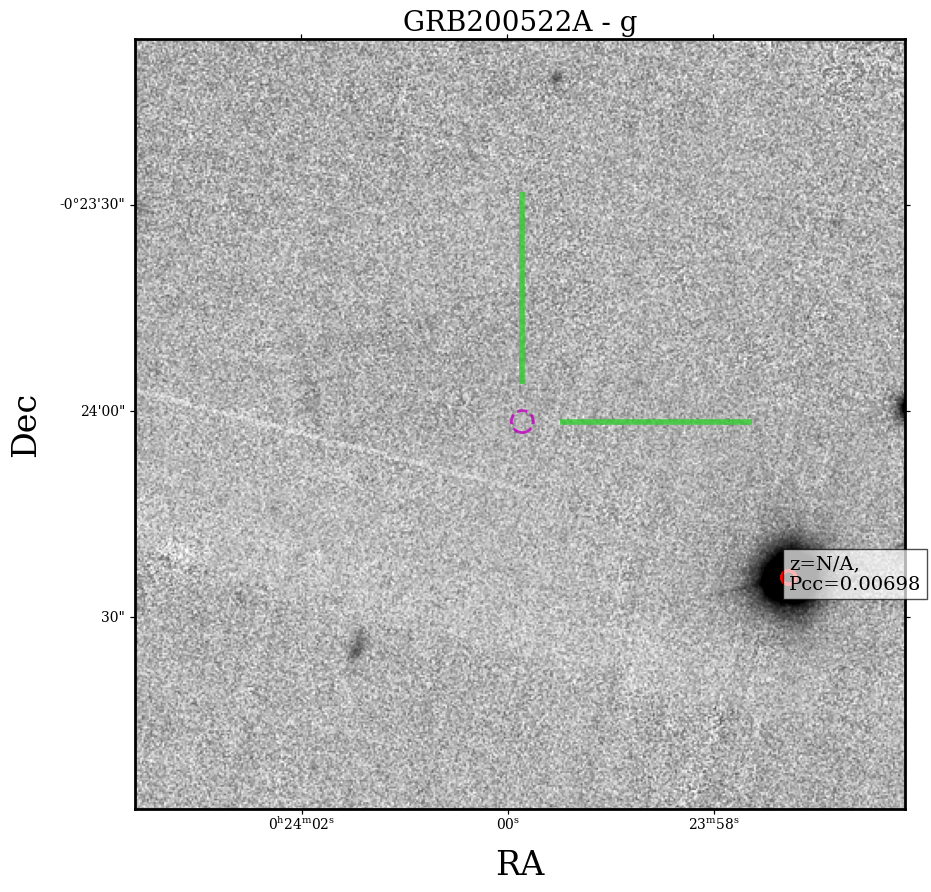

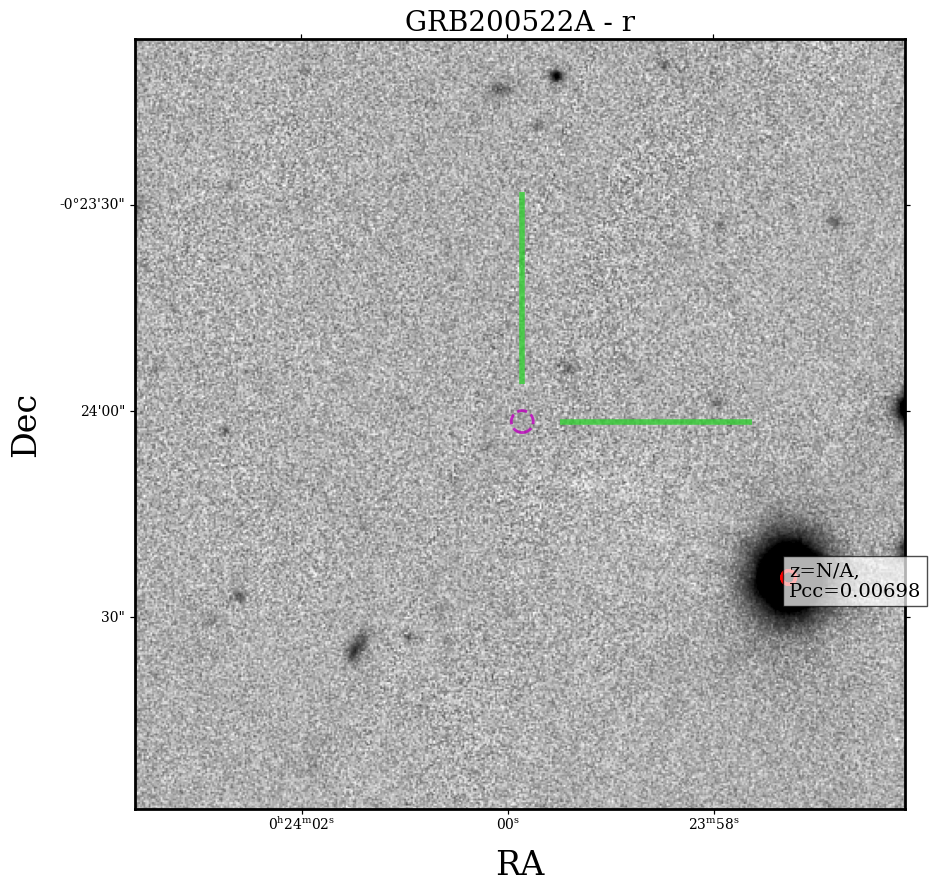

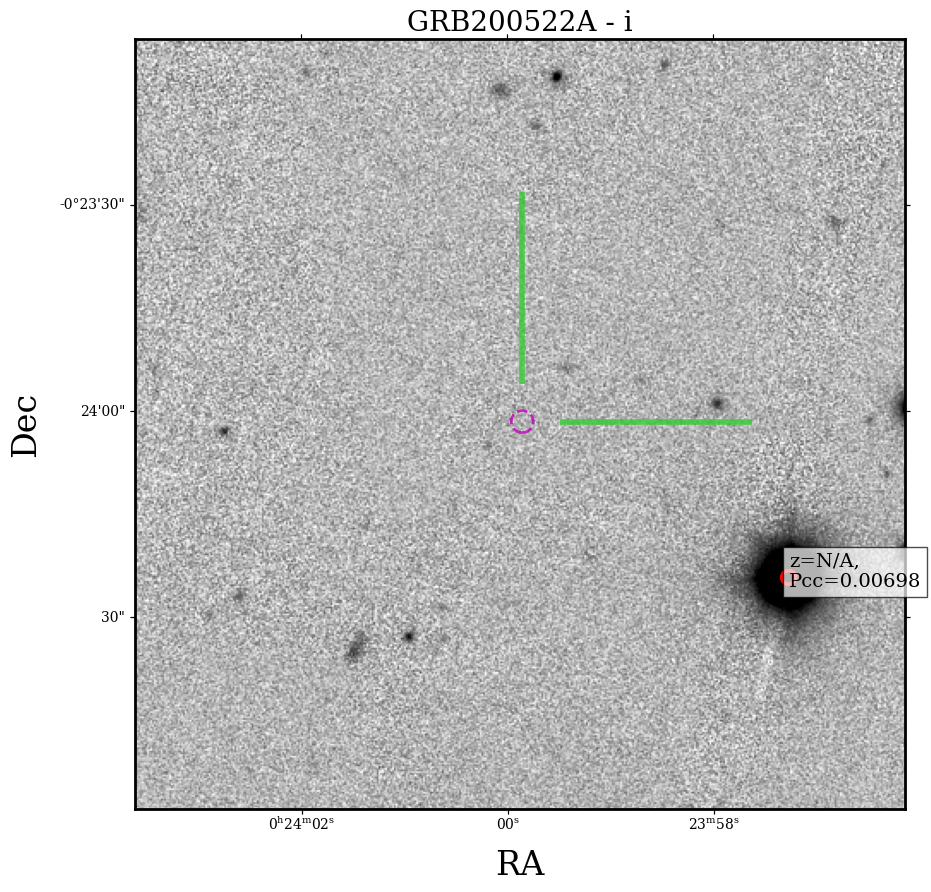

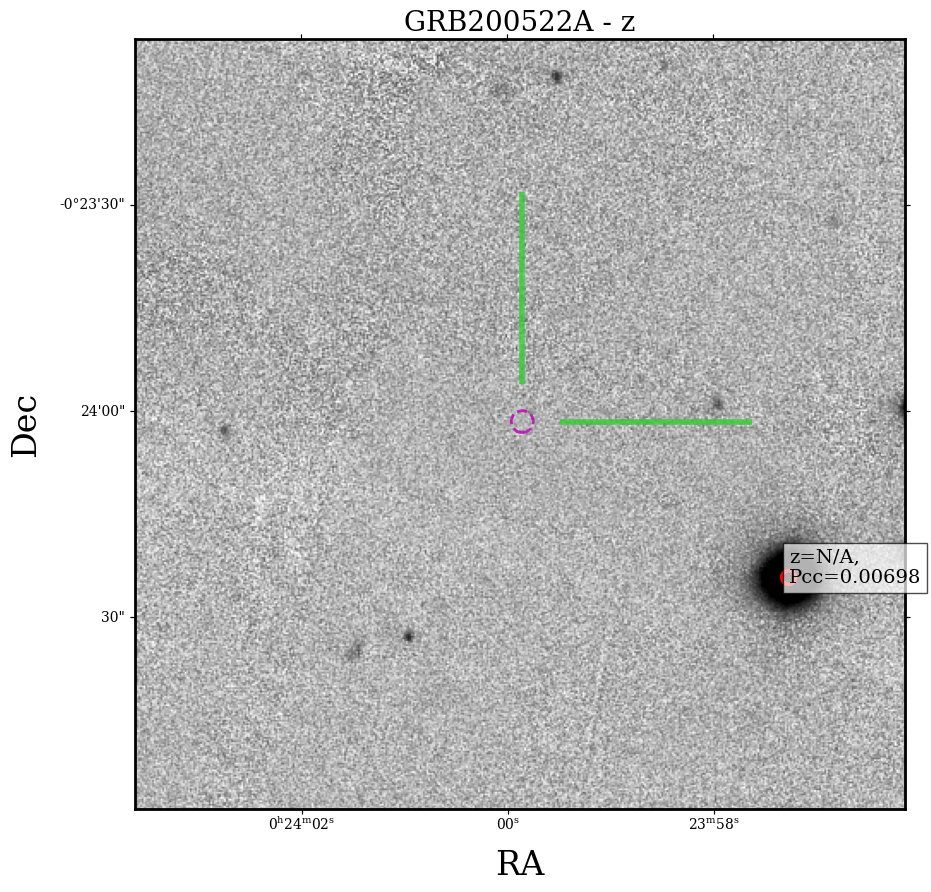

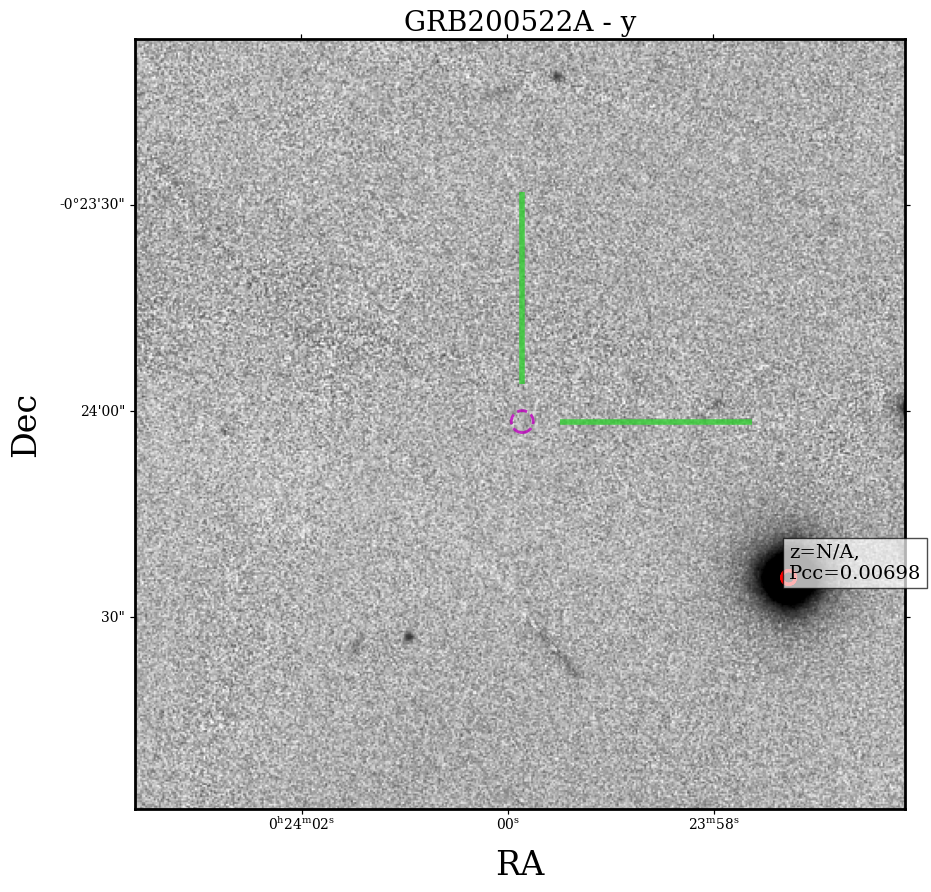

In [27]:
cutouts = ['cutout_rings.v3.skycell.2228.012.stk.g.unconv.fits',
           'cutout_rings.v3.skycell.2228.012.stk.i.unconv.fits',
           'cutout_rings.v3.skycell.2228.012.stk.r.unconv.fits',
           'cutout_rings.v3.skycell.2228.012.stk.y.unconv.fits',
           'cutout_rings.v3.skycell.2228.012.stk.z.unconv.fits'
          ]

# plot_all_filts(coord,object_name,catalog,filters,boxsize=1.0,colorcode_gal = True,use_cutout_img=cutouts,best_pcc_img=True)s
# find the distance from the xrt position to the min_pcc galaxy
coord_min = util.parse_coord(ra_pcc[np.argmin(pccs)], dec_pcc[np.argmin(pccs)])
min_pcc_distance = coord.separation(coord_min).arcminute

# make plot, boxsize needs to fit to be able to see where the min_pcc galaxy is
catalog_short = best_pcc_img(coord,pccs,z_gal,marks,ra_pcc,dec_pcc,num=10,filters=filters,boxsize=2.5*min_pcc_distance,
             figsize=8,colorcode_gal=False)

# make this plot my own and figure out what the green crosshairs are doing here, circle/something around min pcc galaxy then list its attributes

In [8]:
# Create and display magnitudes of lowest Pcc sources only

def key_catalog_props(catalog):
    
    # take only ten lowest pcc values
    args = np.argsort(pccs)
    num = 10
    
    # make pccs, z, marks, ra and dec into a table
    catalog_short = Table()
    catalog_short['pcc'] = np.around(pccs[args][:num],5)

   # the other way of printing without formatting result (i.e. -0.272452) if this is better instead
   # catalog_short['ra'] = ra_pcc[args][:num]
   # catalog_short['dec'] = dec_pcc[args][:num]

    # for ra and dec, translate into formatted units
    ra_angle = Angle(ra_pcc[args][:num], unit='degree')
    catalog_short['ra'] = ra_angle.to_string(unit='hourangle', sep=('h', 'm', 's'), precision=3, alwayssign=True)
    
    dec_angle = Angle(dec_pcc[args][:num], unit=u.deg)
    catalog_short['dec'] = dec_angle.to_string(unit=u.deg, sep=(chr(176), '\'', '"'), precision=3, alwayssign=True)
    
    catalog_short['z'] = z_gal[args][:num]
    catalog_short['rmag'] = np.around(rmag[args][:num],3)
    catalog_short['Source'] = source[args][:num]
    
    print(catalog_short)
        
key_catalog_props(catalog)

  pcc         ra           dec        z     rmag  Source
------- ------------- ------------- ------ ------ ------
0.00698 +0h22m37.714s -0°16'12.590" -999.0 12.981  Other
0.00722 +0h22m37.715s -0°16'12.587" -999.0 13.026  Other
0.00723 +0h22m37.716s -0°16'12.630" -999.0 13.027  Other
0.00723 +0h22m37.714s -0°16'12.616" -999.0 13.027  Other
0.00725 +0h22m37.713s -0°16'12.572" -999.0 13.031  Other
0.00734 +0h22m37.717s -0°16'12.630" -999.0 13.048  Other
0.00742 +0h22m37.716s -0°16'12.601" -999.0 13.064  Other
0.00747 +0h22m37.718s -0°16'12.601" -999.0 13.074  Other
0.00751 +0h22m37.719s -0°16'12.598" -999.0 13.081  Other
0.00753 +0h22m37.716s -0°16'12.554" -999.0 13.084  Other


In [12]:
catalog2 = util.mask_catalog_around_coord(catalog, coord, radius=60.0*u.arcsec)

catalog[1]['ps1dr2_objName'],catalog[1]['ps1dr2_rMeanPSFMag'],catalog2[1]['ps1dr2_rMeanKronMag']

('PSO J212.2758+27.8842', masked, masked)

### GCN search - this will download GCN data and display hyperlinks to GCNs that contain photometry

In [28]:
# Works on GRB name.  Make sure you have a GRB name similar to those in GCN titles
# Display all GCN urls with photometry.  Set all_url=True to get all GCNs instead
gcns = util.get_grb_gcn(object_name)
all_url = False
if gcns is not None:
    gcn_mask = util.get_mag_mask(gcns)
    if all_url: gcn_mask=np.array([True]*len(gcns))
    for gcn in np.array(gcns)[gcn_mask]:
        subj=util.parse_circular_subject(gcn)
        num=util.parse_circular_number(gcn)
        if num and subj:
            url=util.get_gcn_url(num)
            disp="""<a href="{0}" target="_blank">{1}</a>""".format(url, subj)
            display(HTML(disp))

### Visibility - this will plot the visibility of coord from various observatories on a particular date

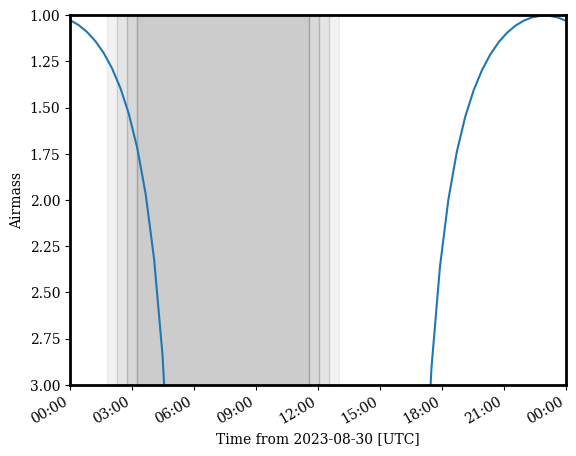

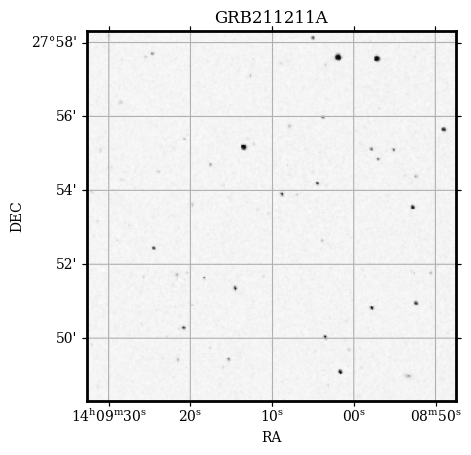

In [51]:
def airmass_curve(location):
    '''
    Produces airmass curve + findre chart of GRB at a specified site and time zone.
    Current telescopes are MMT, Gemini-North/Keck (Mauna Kea), Gemini-South.
    
    PARAMETERS
    -----------
    location: choose from GS, MaunaKea, MMT. 
    Uses target coord and object_name from ntoebook.
    
    RETURNS
    -------
    Airmass curve plot in UTC.
    '''
    
    now = Time(datetime.datetime.now())

    times=now+TimeDelta(60*np.linspace(0,24*60,24*60), format='sec')
    GS=EarthLocation(lat=-30.24075*u.deg, lon=-70.73669333, height=2722*u.m)
    MK=EarthLocation(lat=19.826*u.deg, lon=-155.4747*u.deg, height=4145*u.m)
    MMT=EarthLocation(lat=31.6883*u.deg, lon=-110.8850*u.deg, height=2606*u.m)

    # Make plot cover the next 24 hours
    t1 = datetime.datetime.now(tz=pytz.timezone('Chile/Continental'))
    date=Time(t1.strftime('%Y-%m-%d'))#,tzname='Chile/Continental')

    observe_time = date + np.linspace(0, 24, 60)*u.hour

    target = FixedTarget(name=object_name, coord=coord)

    if location == 'GS':
        observer = Observer(name='Gemini-South',
                       location=GS,
                       timezone=timezone('Chile/Continental'),
                       description="Gemini-South on Cerro Pachon")
    if location == 'MaunaKea':
        observer = Observer(name='Mauna Kea',
                       location=MK,
                       timezone=timezone('US/Hawaii'),
                       description="Gemini-North or Keck on Mauna Kea")
    if location == 'MMT':
        observer = Observer(name='MMT',
                       location=MMT,
                       timezone=timezone('US/Arizona'),
                       description="MMT on Mt. Hopkins")

    
    plot_airmass(target,observer,observe_time, brightness_shading=True)#, style_sheet=dark_style_sheet,use_local_tz=True)

    plt.figure()
    ax, hdu = plot_finder_image(target)
    plt.show()
    
airmass_curve('MMT')

findfont: Generic family 'serif' not found because none of the following families were found: Times
findfont: Generic family 'serif' not found because none of the following families were found: Times
findfont: Generic family 'serif' not found because none of the following families were found: Times
findfont: Generic family 'serif' not found because none of the following families were found: Times
findfont: Generic family 'serif' not found because none of the following families were found: Times
findfont: Generic family 'serif' not found because none of the following families were found: Times
findfont: Generic family 'serif' not found because none of the following families were found: Times
findfont: Generic family 'serif' not found because none of the following families were found: Times
findfont: Generic family 'serif' not found because none of the following families were found: Times
findfont: Generic family 'serif' not found because none of the following families were found: Times


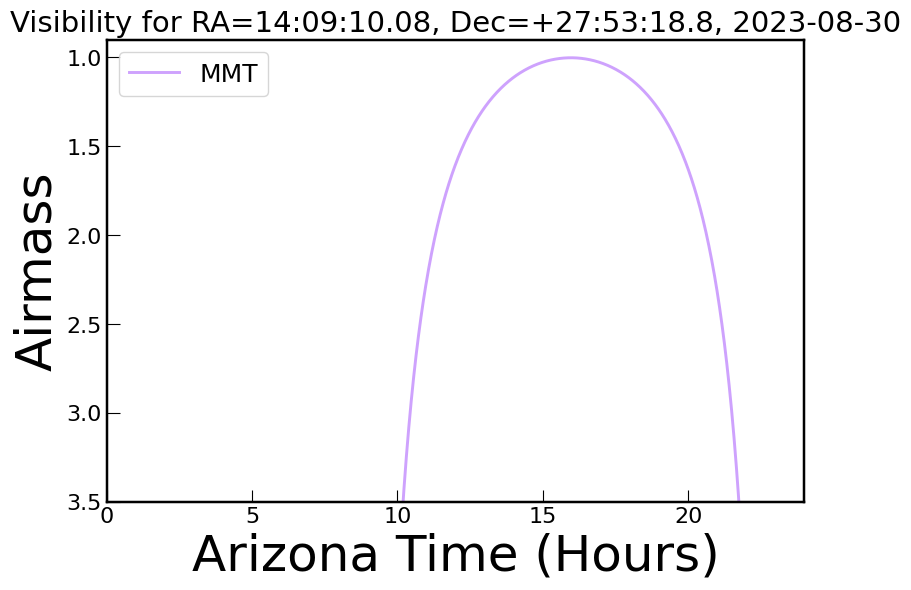

findfont: Generic family 'serif' not found because none of the following families were found: Times
findfont: Generic family 'serif' not found because none of the following families were found: Times
findfont: Generic family 'serif' not found because none of the following families were found: Times
findfont: Generic family 'serif' not found because none of the following families were found: Times
findfont: Generic family 'serif' not found because none of the following families were found: Times
findfont: Generic family 'serif' not found because none of the following families were found: Times
findfont: Generic family 'serif' not found because none of the following families were found: Times
findfont: Generic family 'serif' not found because none of the following families were found: Times
findfont: Generic family 'serif' not found because none of the following families were found: Times
findfont: Generic family 'serif' not found because none of the following families were found: Times


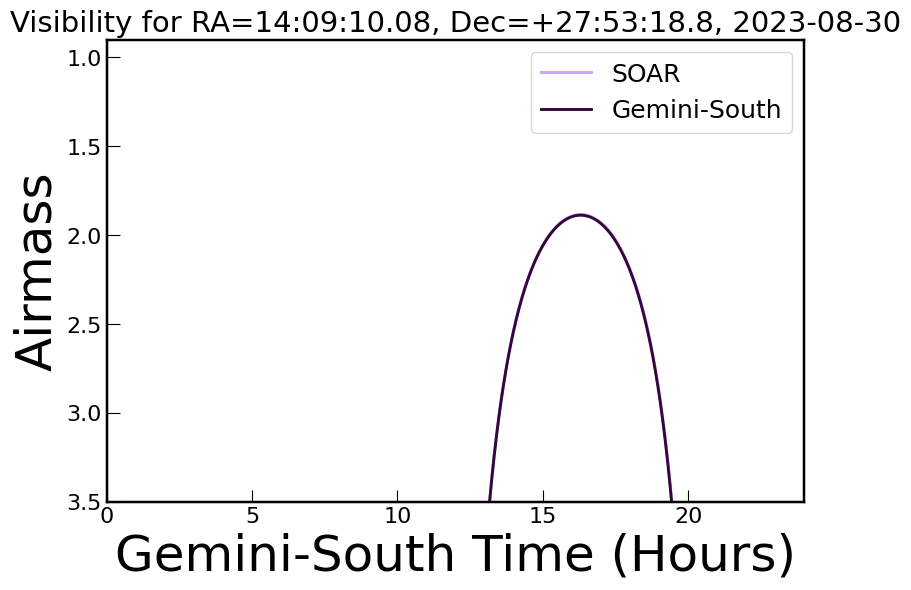

findfont: Generic family 'serif' not found because none of the following families were found: Times
findfont: Generic family 'serif' not found because none of the following families were found: Times
findfont: Generic family 'serif' not found because none of the following families were found: Times
findfont: Generic family 'serif' not found because none of the following families were found: Times
findfont: Generic family 'serif' not found because none of the following families were found: Times
findfont: Generic family 'serif' not found because none of the following families were found: Times
findfont: Generic family 'serif' not found because none of the following families were found: Times
findfont: Generic family 'serif' not found because none of the following families were found: Times
findfont: Generic family 'serif' not found because none of the following families were found: Times
findfont: Generic family 'serif' not found because none of the following families were found: Times


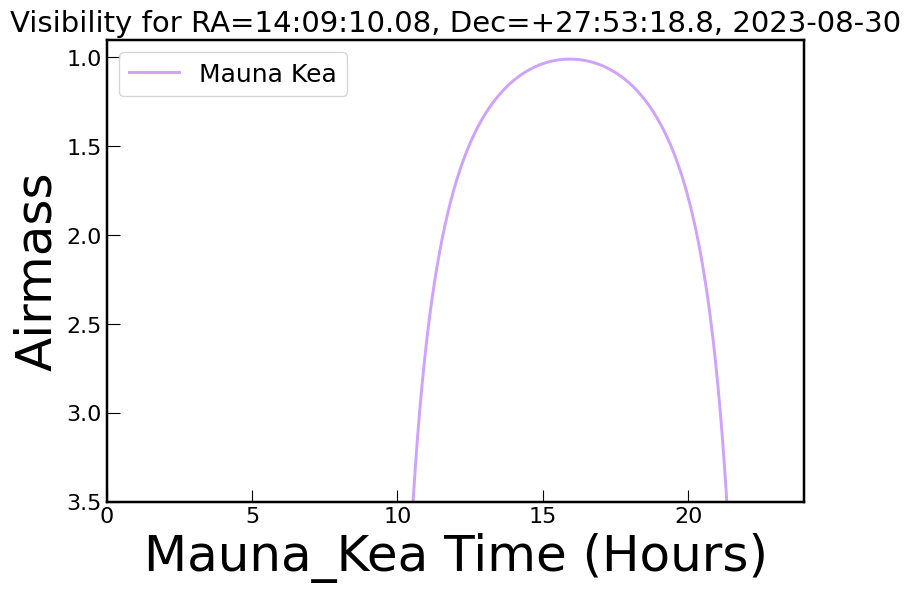

In [53]:
# Set up your plot

colors=['xkcd:lilac','xkcd:dark purple','xkcd:magenta','xkcd:shocking pink','xkcd:orange']

utcoffset_Chicago = -5*u.hour  # Central Daylight Time (set to -6 for Standard time)
utcoffset_Maunakea = -10*u.hour # Hawaii Standard Time
utcoffset_Arizona = -7*u.hour # Arizona Standard Time
utcoffset_GeminiSouth = -4*u.hour # Cerro Pachon, Gemini-South Time

def airmass_figure(utcoffset,site,MMT=True,Maunakea=True,SOAR=True,VLA=True,GeminiSouth=True):
    '''
    Produces airmass curve of GRB at a specified site and time zone.
    Current telescopes are MMT, Mauna Kea, SOAR and the VLA.
    
    PARAMETERS
    -----------
    UTC offset (choose from above), site name to display on figure, 
    set observatories you do not wish to display to False
    
    RETURNS
    -------
    Airmass curve plot in the specified time zone
    '''
    figsize=3.0
    rc('font',**{'family':'serif','serif':['Times'],'size':4.0*figsize})
    fig, ax = plt.subplots()
    for i in ax.spines.keys(): ax.spines[i].set_linewidth(0.6*figsize)
    fig.set_size_inches(3.0*figsize, 2.0*figsize)

    # Specifying the locations of the observatories:
    observatories={}
    if Maunakea==True:
        observatories['Mauna Kea']=EarthLocation(lat=19.826*u.deg, lon=-155.4747*u.deg, height=4145*u.m)
    if MMT==True:
        observatories['MMT']=EarthLocation(lat=31.6883*u.deg, lon=-110.8850*u.deg, height=2606*u.m)
    if SOAR==True:
        observatories['SOAR']=EarthLocation(lat=-30.1690*u.deg, lon=-70.8063*u.deg, height=2200*u.m)
    if GeminiSouth==True:
        observatories['Gemini-South']=EarthLocation(lat=-30.24075*u.deg, lon=-70.73669333, height=2722*u.m)
    # add Gemini North 
    # observatories['VLA']=EarthLocation(lat=34.0784*u.deg, lon=-107.6184*u.deg, height=2120*u.m)

    # Set date for airmass values you want to plot
    date = Time(datetime.datetime.now())

    date=Time(date.datetime.strftime('%Y-%m-%d'))
    times=date+TimeDelta(60*np.linspace(0,24*60,24*60), format='sec')
    altitudes={}
    for key in observatories.keys(): 
        altitudes[key]=[coord.transform_to(AltAz(obstime=times-utcoffset,
            location=observatories[key])).alt.degree]
    i=0
    for key in altitudes.keys():
        dayfrac=np.linspace(0,24*60,24*60)/60.
        altitude=np.array(altitudes[key][0])
        zenith=90.0-altitude
        airmass=1./np.cos(zenith*np.pi/180.0)
        mask=altitude<0
        airmass[mask]=np.nan
        ax.plot(dayfrac, airmass, label=key, linewidth=0.7*figsize,color=colors[i])
        i+=1

    ra_hms, dec_dms=coord.to_string(style='hmsdms', sep=':').split()
    plt.legend(fontsize=18)
    ax.set_title('Visibility for RA={0}, Dec={1}, {2}'.format(ra_hms, dec_dms, date.datetime.strftime('%Y-%m-%d')),
                fontsize=7.0*figsize)

    ax.set_ylim([3.5,0.9])
    ax.set_xlim([0,24])
    ax.set_xlabel(site+' Time (Hours)',fontsize=12.0*figsize)
    ax.set_ylabel('Airmass',fontsize=12.0*figsize)
    ax.tick_params(direction = 'in', length = 9, labelsize = 16)
    ax.tick_params(which = 'minor', direction = 'in', length = 6)
    plt.savefig(data_path+'Airmass_{0}_{1}.png'.format(site,str(date).split(' ')[0]),dpi=200,bbox_inches='tight')

    
airmass_figure(utcoffset_Arizona,'Arizona',Maunakea=False,SOAR=False,VLA=False,GeminiSouth=False)
airmass_figure(utcoffset_GeminiSouth,'Gemini-South',MMT=False,Maunakea=False,SOAR=True,VLA=False,GeminiSouth=True)
airmass_figure(utcoffset_Maunakea,'Mauna_Kea',MMT=False,Maunakea=True,SOAR=False,VLA=False,GeminiSouth=False)

Text(0, 0.5, 'Airmass')

findfont: Generic family 'serif' not found because none of the following families were found: Times
findfont: Generic family 'serif' not found because none of the following families were found: Times
findfont: Generic family 'serif' not found because none of the following families were found: Times
findfont: Generic family 'serif' not found because none of the following families were found: Times
findfont: Generic family 'serif' not found because none of the following families were found: Times
findfont: Generic family 'serif' not found because none of the following families were found: Times
findfont: Generic family 'serif' not found because none of the following families were found: Times
findfont: Generic family 'serif' not found because none of the following families were found: Times
findfont: Generic family 'serif' not found because none of the following families were found: Times
findfont: Generic family 'serif' not found because none of the following families were found: Times


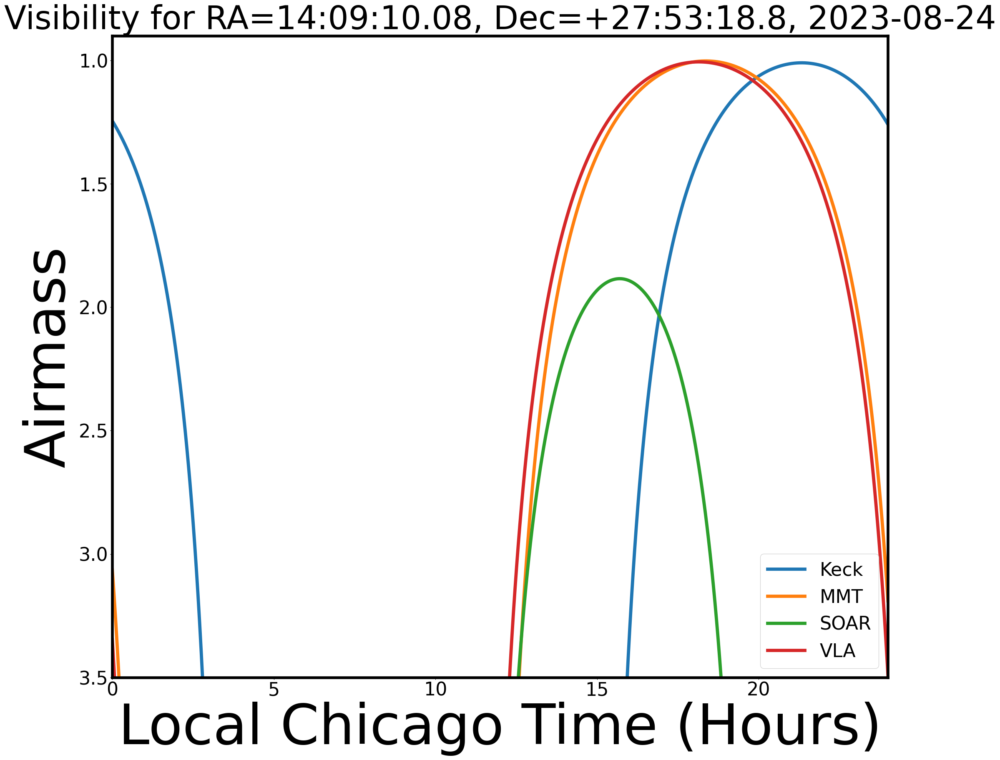

In [23]:
from astropy.coordinates import SkyCoord, EarthLocation, AltAz
from astropy import units as u
from astropy.time import Time, TimeDelta
import matplotlib.pyplot as plt
from matplotlib import rc

figsize=8.0
rc('font',**{'family':'serif','serif':['Times'],'size':4.0*figsize})
fig, ax = plt.subplots()
for i in ax.spines.keys(): ax.spines[i].set_linewidth(0.6*figsize)
fig.set_size_inches(3.0*figsize, 2.5*figsize)

observatories={}
observatories['Keck']=EarthLocation(lat=19.826*u.deg, lon=-155.4747*u.deg, height=4145*u.m)
observatories['MMT']=EarthLocation(lat=31.6883*u.deg, lon=-110.8850*u.deg, height=2606*u.m)
observatories['SOAR']=EarthLocation(lat=-30.1690*u.deg, lon=-70.8063*u.deg, height=2200*u.m)
observatories['VLA']=EarthLocation(lat=34.0784*u.deg, lon=-107.6184*u.deg, height=2120*u.m)

# Set date for airmass values you want to plot
date = Time(datetime.datetime.now())
#date = Time('2021-04-21')

utcoffset = -5*u.hour  # Central Daylight Time (set to -6 for Standard time)

date=Time(date.datetime.strftime('%Y-%m-%d'))
times=date+TimeDelta(60*np.linspace(0,24*60,24*60), format='sec')
altitudes={}
for key in observatories.keys(): 
    altitudes[key]=[coord.transform_to(AltAz(obstime=times-utcoffset,
        location=observatories[key])).alt.degree]

for key in altitudes.keys():
    dayfrac=np.linspace(0,24*60,24*60)/60.
    altitude=np.array(altitudes[key][0])
    zenith=90.0-altitude
    airmass=1./np.cos(zenith*np.pi/180.0)
    mask=altitude<0
    airmass[mask]=np.nan
    ax.plot(dayfrac, airmass, label=key, linewidth=0.7*figsize)

ra_hms, dec_dms=coord.to_string(style='hmsdms', sep=':').split()
plt.legend()
ax.set_title('Visibility for RA={0}, Dec={1}, {2}'.format(ra_hms, dec_dms, date.datetime.strftime('%Y-%m-%d')),
            fontsize=7.0*figsize)

ax.set_ylim([3.5,0.9])
ax.set_xlim([0,24])
ax.set_xlabel('Local Chicago Time (Hours)',fontsize=12.0*figsize)
ax.set_ylabel('Airmass',fontsize=12.0*figsize)